# Exploring image preprocessing and augmentation

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

from tensorflow.keras.preprocessing import image_dataset_from_directory

2022-12-22 01:09:52.773416: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
def render_history(history):
    plt.plot(history["loss"], label="loss")
    plt.plot(history["val_loss"], label="val_loss")
    plt.legend()
    plt.title("Losses")
    plt.show()
    plt.close()

    plt.plot(history["accuracy"], label="accuracy")
    plt.plot(history["val_accuracy"], label="val_accuracy")
    plt.legend()
    plt.title("Accuracies")
    plt.show()
    plt.close()

In [3]:
image_size = (250, 250)
batch_size = 32

In [4]:
train_ds = image_dataset_from_directory(
    '..//dat/train/', 
    seed=4231,
    image_size=image_size, 
    shuffle=True,
    batch_size=batch_size,
    crop_to_aspect_ratio=True,
    color_mode='rgb'
)

Found 2816 files belonging to 2 classes.


2022-12-22 01:09:54.068345: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
val_ds = image_dataset_from_directory(
    '../dat/val/', 
    seed=4231,
    image_size=image_size, 
    shuffle=True,
    batch_size=batch_size,
    crop_to_aspect_ratio=True,
    color_mode='rgb'
)

Found 412 files belonging to 2 classes.


In [6]:
test_ds = image_dataset_from_directory(
    '../dat/test/', 
    seed=4231,
    image_size=image_size, 
    shuffle=False,
    batch_size=batch_size,
    crop_to_aspect_ratio=True,
    color_mode='rgb'
)

Found 764 files belonging to 2 classes.


In [7]:
class_names = train_ds.class_names
print(class_names)

['female', 'male']


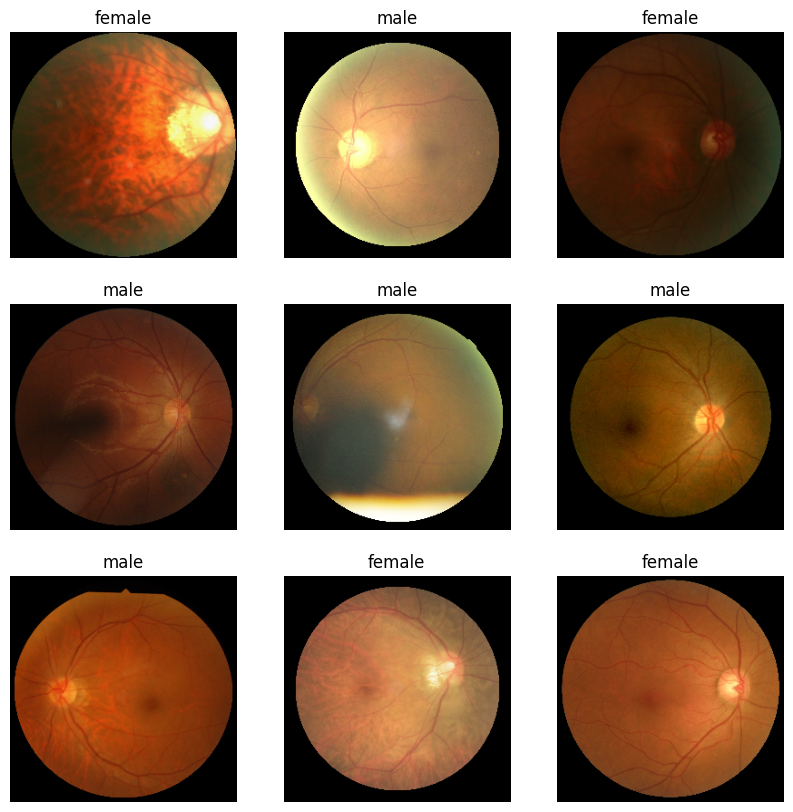

In [8]:
plt.figure(figsize=(10, 10))

for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [9]:
# Create preprocessing layers
out_height, out_width = 128,256
resize = tf.keras.layers.Resizing(out_height, out_width)
height = tf.keras.layers.RandomHeight(0.3)
width = tf.keras.layers.RandomWidth(0.3)
zoom = tf.keras.layers.RandomZoom(0.3)
 
flip = tf.keras.layers.RandomFlip("horizontal_and_vertical")
rotate = tf.keras.layers.RandomRotation(0.2)
crop = tf.keras.layers.RandomCrop(out_height, out_width)
translation = tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2)
 
brightness = tf.keras.layers.RandomBrightness([-0.8, 0.8])
contrast = tf.keras.layers.RandomContrast((0.4, 0.7))

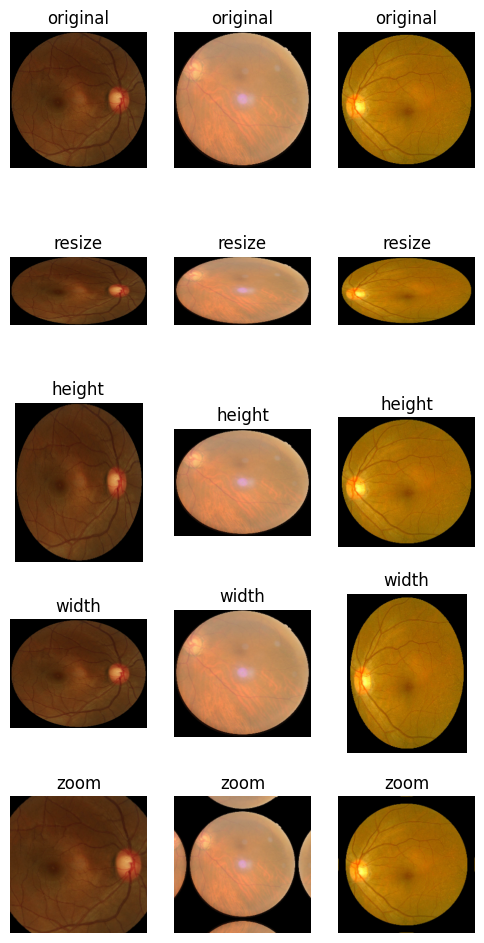

In [10]:
# Visualize images and augmentations
fig, ax = plt.subplots(5, 3, figsize=(6,12))
for images, labels in train_ds.take(1):
    for i in range(3):
        ax[0][i].imshow(images[i].numpy().astype("uint8"))
        ax[0][i].set_title("original")
        ax[0][i].axis('off')
        # resize
        ax[1][i].imshow(resize(images[i]).numpy().astype("uint8"))
        ax[1][i].set_title("resize")
        ax[1][i].axis('off')
        # height
        ax[2][i].imshow(height(images[i]).numpy().astype("uint8"))
        ax[2][i].set_title("height")
        ax[2][i].axis('off')
        # width
        ax[3][i].imshow(width(images[i]).numpy().astype("uint8"))
        ax[3][i].set_title("width")
        ax[3][i].axis('off')
        # zoom
        ax[4][i].imshow(zoom(images[i]).numpy().astype("uint8"))
        ax[4][i].set_title("zoom")
        ax[4][i].axis('off')
plt.show()

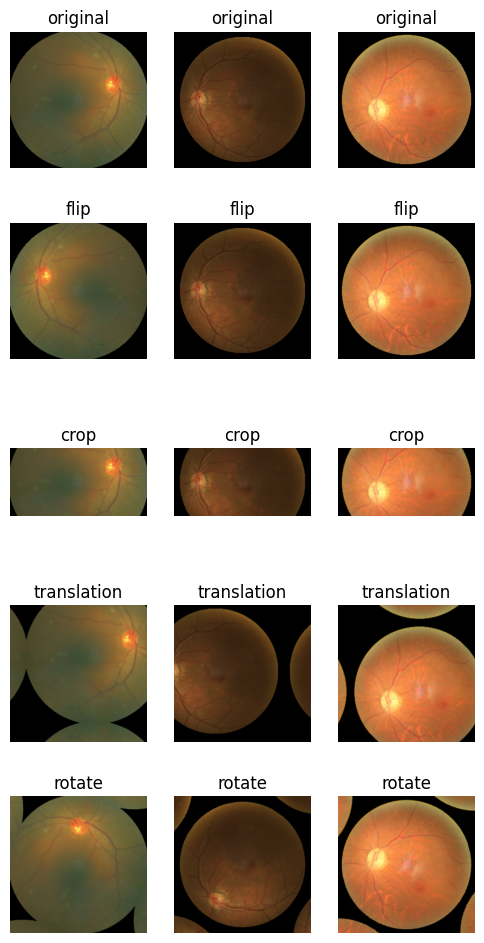

In [11]:
# Visualize images and augmentations

fig, ax = plt.subplots(5, 3, figsize=(6,12))
for images, labels in train_ds.take(1):
    for i in range(3):
        ax[0][i].imshow(images[i].numpy().astype("uint8"))
        ax[0][i].set_title("original")
        ax[0][i].axis('off')
        # flip
        ax[1][i].imshow(flip(images[i]).numpy().astype("uint8"))
        ax[1][i].set_title("flip")
        ax[1][i].axis('off')
        # crop
        ax[2][i].imshow(crop(images[i]).numpy().astype("uint8"))
        ax[2][i].set_title("crop")
        ax[2][i].axis('off')
        # translation
        ax[3][i].imshow(translation(images[i]).numpy().astype("uint8"))
        ax[3][i].set_title("translation")
        ax[3][i].axis('off')
        # rotate
        ax[4][i].imshow(rotate(images[i]).numpy().astype("uint8"))
        ax[4][i].set_title("rotate")
        ax[4][i].axis('off')
plt.show()

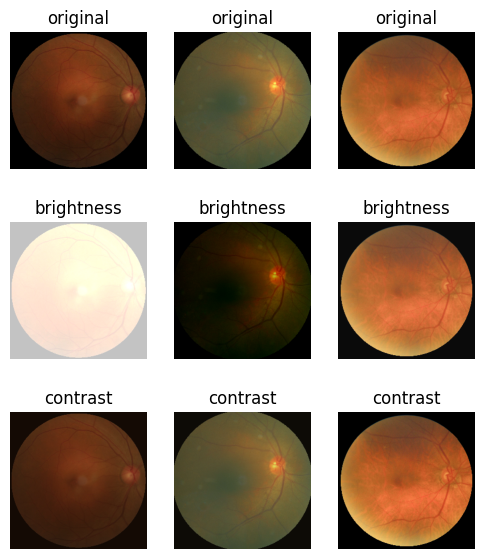

In [12]:
# Visualize images and augmentations

fig, ax = plt.subplots(3, 3, figsize=(6,7))
for images, labels in train_ds.take(1):
    for i in range(3):
        ax[0][i].imshow(images[i].numpy().astype("uint8"))
        ax[0][i].set_title("original")
        ax[0][i].axis('off')
        # brightness
        ax[1][i].imshow(brightness(images[i]).numpy().astype("uint8"))
        ax[1][i].set_title("brightness")
        ax[1][i].axis('off')
        # contrast
        ax[2][i].imshow(contrast(images[i]).numpy().astype("uint8"))
        ax[2][i].set_title("contrast")
        ax[2][i].axis('off')
plt.show()

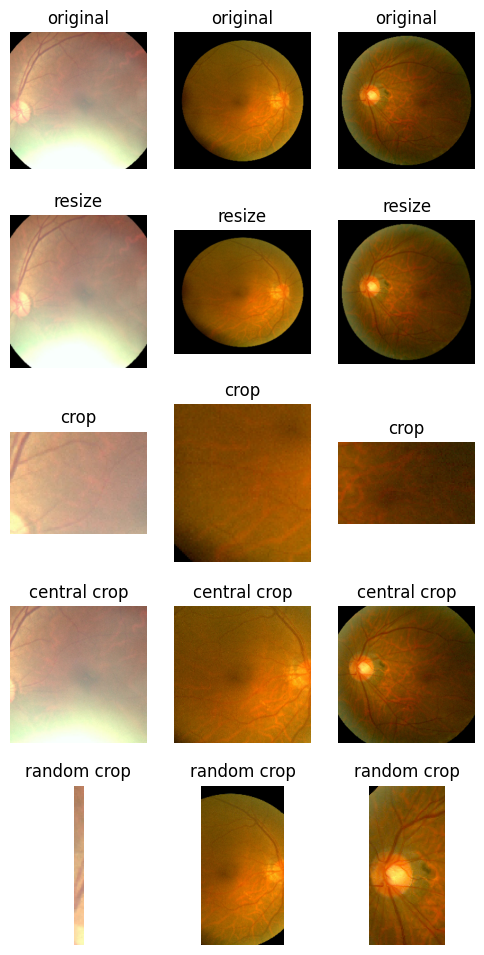

In [13]:
fig, ax = plt.subplots(5, 3, figsize=(6,12))
 
for images, labels in train_ds.take(1):
    for i in range(3):
        # original
        ax[0][i].imshow(images[i].numpy().astype("uint8"))
        ax[0][i].set_title("original")
        ax[0][i].axis('off')
        # resize
        h = int(256 * tf.random.uniform([], minval=0.8, maxval=1.2))
        w = int(256 * tf.random.uniform([], minval=0.8, maxval=1.2))
        ax[1][i].imshow(tf.image.resize(images[i], [h,w]).numpy().astype("uint8"))
        ax[1][i].set_title("resize")
        ax[1][i].axis('off')
        # crop
        y, x, h, w = (128 * tf.random.uniform((4,))).numpy().astype("uint8")
        ax[2][i].imshow(tf.image.crop_to_bounding_box(images[i], y, x, h, w).numpy().astype("uint8"))
        ax[2][i].set_title("crop")
        ax[2][i].axis('off')
        # central crop
        x = tf.random.uniform([], minval=0.4, maxval=1.0)
        ax[3][i].imshow(tf.image.central_crop(images[i], x).numpy().astype("uint8"))
        ax[3][i].set_title("central crop")
        ax[3][i].axis('off')
        # crop to (h,w) at random offset
        h, w = (256 * tf.random.uniform((2,))).numpy().astype("uint8")
        seed = tf.random.uniform((2,), minval=0, maxval=65536).numpy().astype("int32")
        ax[4][i].imshow(tf.image.stateless_random_crop(images[i], [h,w,3], seed).numpy().astype("uint8"))
        ax[4][i].set_title("random crop")
        ax[4][i].axis('off')
plt.show()

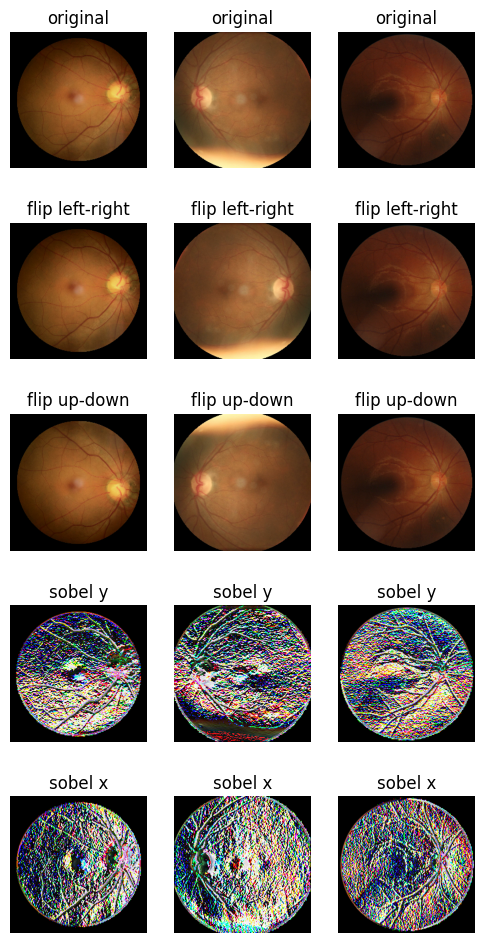

In [14]:
fig, ax = plt.subplots(5, 3, figsize=(6,12))
 
for images, labels in train_ds.take(1):
    for i in range(3):
        ax[0][i].imshow(images[i].numpy().astype("uint8"))
        ax[0][i].set_title("original")
        ax[0][i].axis('off')
        # flip
        seed = tf.random.uniform((2,), minval=0, maxval=65536).numpy().astype("int32")
        ax[1][i].imshow(tf.image.stateless_random_flip_left_right(images[i], seed).numpy().astype("uint8"))
        ax[1][i].set_title("flip left-right")
        ax[1][i].axis('off')
        # flip
        seed = tf.random.uniform((2,), minval=0, maxval=65536).numpy().astype("int32")
        ax[2][i].imshow(tf.image.stateless_random_flip_up_down(images[i], seed).numpy().astype("uint8"))
        ax[2][i].set_title("flip up-down")
        ax[2][i].axis('off')
        # sobel edge
        sobel = tf.image.sobel_edges(images[i:i+1])
        ax[3][i].imshow(sobel[0, ..., 0].numpy().astype("uint8"))
        ax[3][i].set_title("sobel y")
        ax[3][i].axis('off')
        # sobel edge
        ax[4][i].imshow(sobel[0, ..., 1].numpy().astype("uint8"))
        ax[4][i].set_title("sobel x")
        ax[4][i].axis('off')
plt.show()

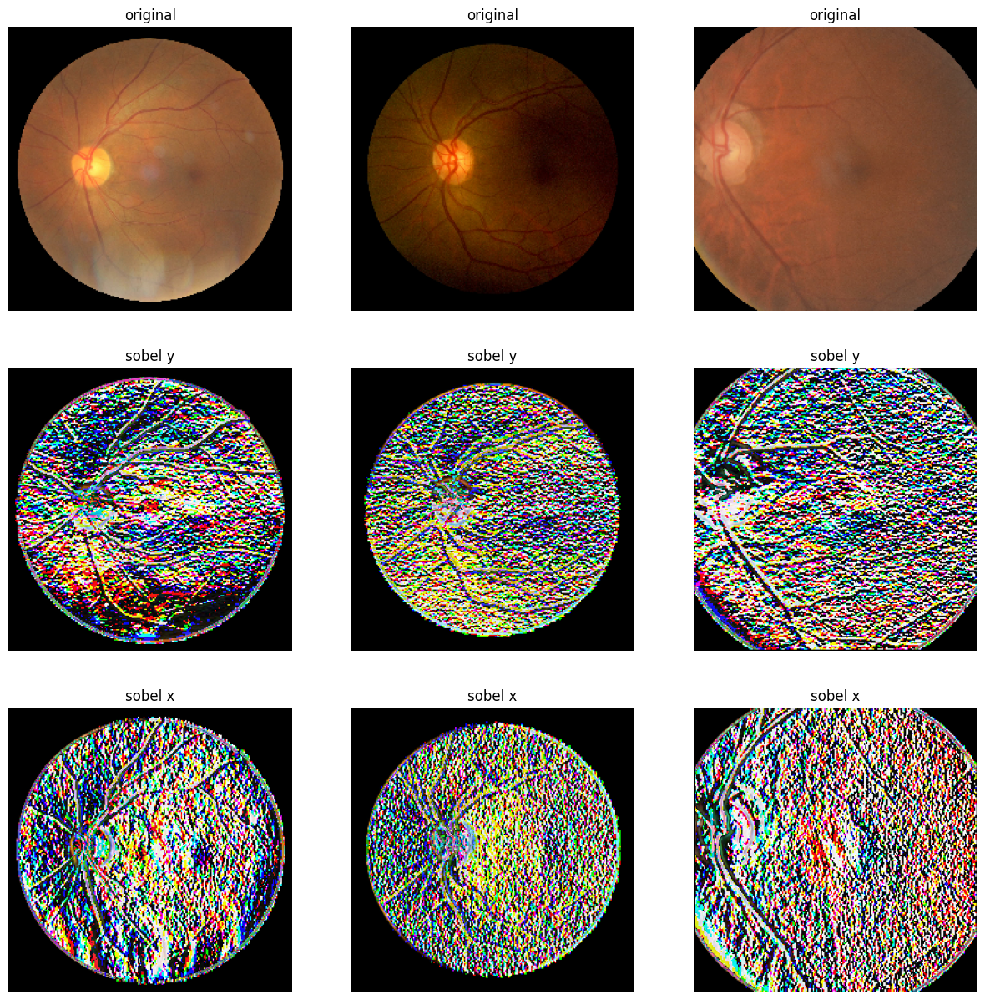

In [15]:
fig, ax = plt.subplots(3, 3, figsize=(15,15))
 
for images, labels in train_ds.take(1):
    for i in range(3):
        ax[0][i].imshow(images[i].numpy().astype("uint8"))
        ax[0][i].set_title("original")
        ax[0][i].axis('off')
        # sobel edge
        sobel = tf.image.sobel_edges(images[i:i+1])
        ax[1][i].imshow(sobel[0, ..., 0].numpy().astype("uint8"))
        ax[1][i].set_title("sobel y")
        ax[1][i].axis('off')
        # sobel edge
        ax[2][i].imshow(sobel[0, ..., 1].numpy().astype("uint8"))
        ax[2][i].set_title("sobel x")
        ax[2][i].axis('off')
plt.show()

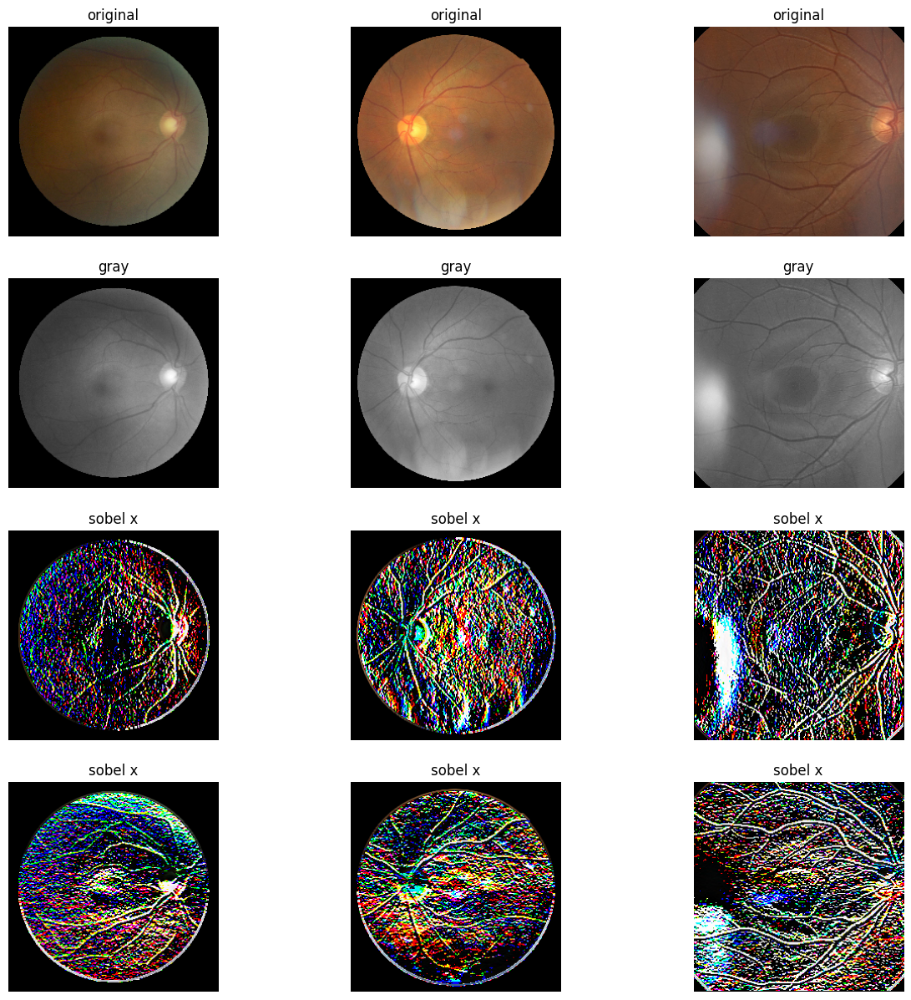

In [16]:
fig, ax = plt.subplots(4, 3, figsize=(15,15))
 
for images, labels in train_ds.take(1):
    for i in range(3):
        ax[0][i].imshow(images[i].numpy().astype("uint8"))
        ax[0][i].set_title("original")
        ax[0][i].axis('off')
        # to gray scale
        gray = tf.image.rgb_to_grayscale(images[i:i+1])
        ax[1][i].imshow(gray[0, ..., 0].numpy().astype("uint8"), cmap='gray')
        ax[1][i].set_title("gray")
        ax[1][i].axis('off')

        # sobel edge
        sobel = tf.image.sobel_edges(images[i:i+1])
        ax[2][i].imshow((sobel[0, ..., 1] / 4 + 0.5).numpy().astype("uint8"))
        ax[2][i].set_title("sobel x")
        ax[2][i].axis('off')

        # sobel edge
        ax[3][i].imshow((sobel[0, ..., 0] / 4 + 0.5).numpy().astype("uint8"))
        ax[3][i].set_title("sobel x")
        ax[3][i].axis('off')
plt.show()

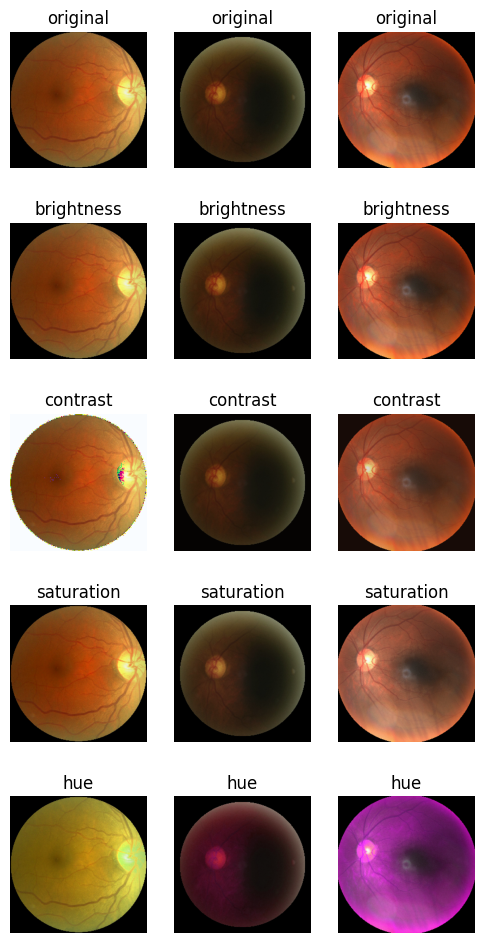

In [17]:
...
fig, ax = plt.subplots(5, 3, figsize=(6,12))
 
for images, labels in train_ds.take(1):
    for i in range(3):
        ax[0][i].imshow(images[i].numpy().astype("uint8"))
        ax[0][i].set_title("original")
        ax[0][i].axis('off')
        # brightness
        seed = tf.random.uniform((2,), minval=0, maxval=65536).numpy().astype("int32")
        ax[1][i].imshow(tf.image.stateless_random_brightness(images[i], 0.3, seed).numpy().astype("uint8"))
        ax[1][i].set_title("brightness")
        ax[1][i].axis('off')
        # contrast
        ax[2][i].imshow(tf.image.stateless_random_contrast(images[i], 0.7, 1.3, seed).numpy().astype("uint8"))
        ax[2][i].set_title("contrast")
        ax[2][i].axis('off')
        # saturation
        ax[3][i].imshow(tf.image.stateless_random_saturation(images[i], 0.7, 1.3, seed).numpy().astype("uint8"))
        ax[3][i].set_title("saturation")
        ax[3][i].axis('off')
        # hue
        ax[4][i].imshow(tf.image.stateless_random_hue(images[i], 0.3, seed).numpy().astype("uint8"))
        ax[4][i].set_title("hue")
        ax[4][i].axis('off')
plt.show()

In [18]:
def augment_sobel(image, label):
    sobel = tf.image.sobel_edges(image)
    sobel_y = (sobel[..., 0] / 4 + 0.5)
    return sobel_y, label
 
resized_ds = train_ds.map(augment_sobel)

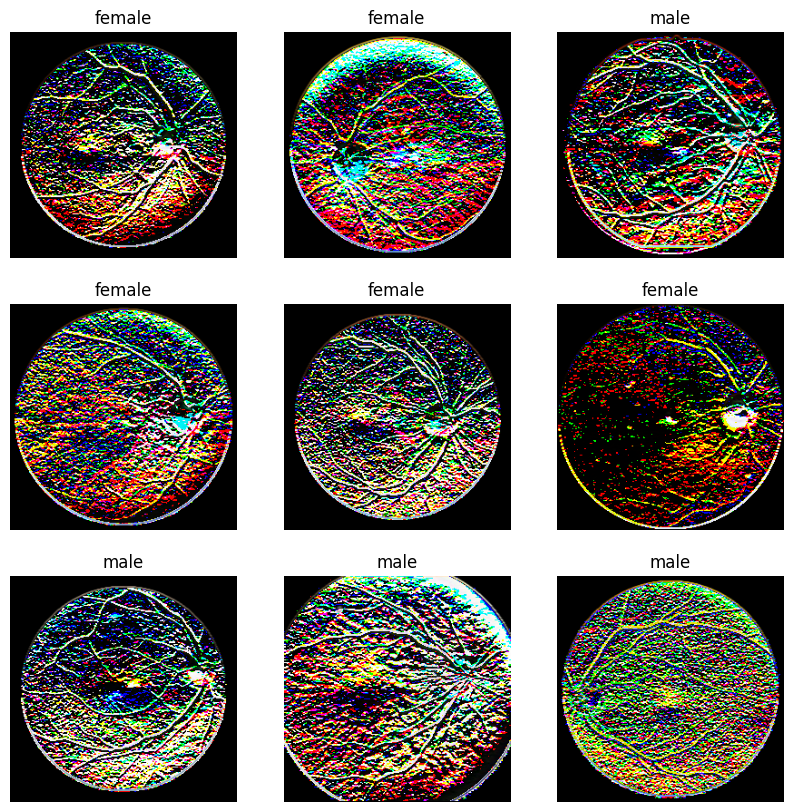

In [19]:
plt.figure(figsize=(10, 10))

for images, labels in resized_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"), cmap='gray')
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [20]:
resized_ds.take(1)

<TakeDataset element_spec=(TensorSpec(shape=(None, 250, 250, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [21]:
def augment_gray(image, label):
    gray = tf.image.rgb_to_grayscale(image)
    #gray_map = gray[0, ..., 0]
    return gray, label
 
gray_ds = train_ds.map(augment_gray)

In [22]:
gray_ds.take(1)

<TakeDataset element_spec=(TensorSpec(shape=(None, 250, 250, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

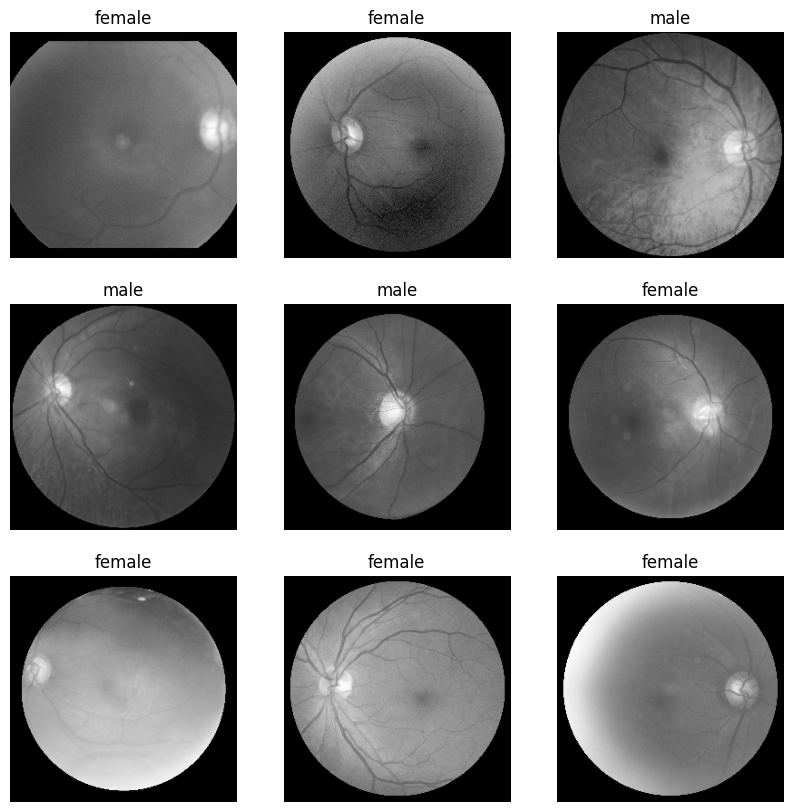

In [23]:
plt.figure(figsize=(10, 10))

for images, labels in gray_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i][:,:,0].numpy().astype("uint8"), cmap='gray')
        # plt.imshow(images[i][:,:,0].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [24]:
gray_sobel_ds = gray_ds.map(augment_sobel)

In [25]:
gray_sobel_ds.take(1)

<TakeDataset element_spec=(TensorSpec(shape=(None, 250, 250, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

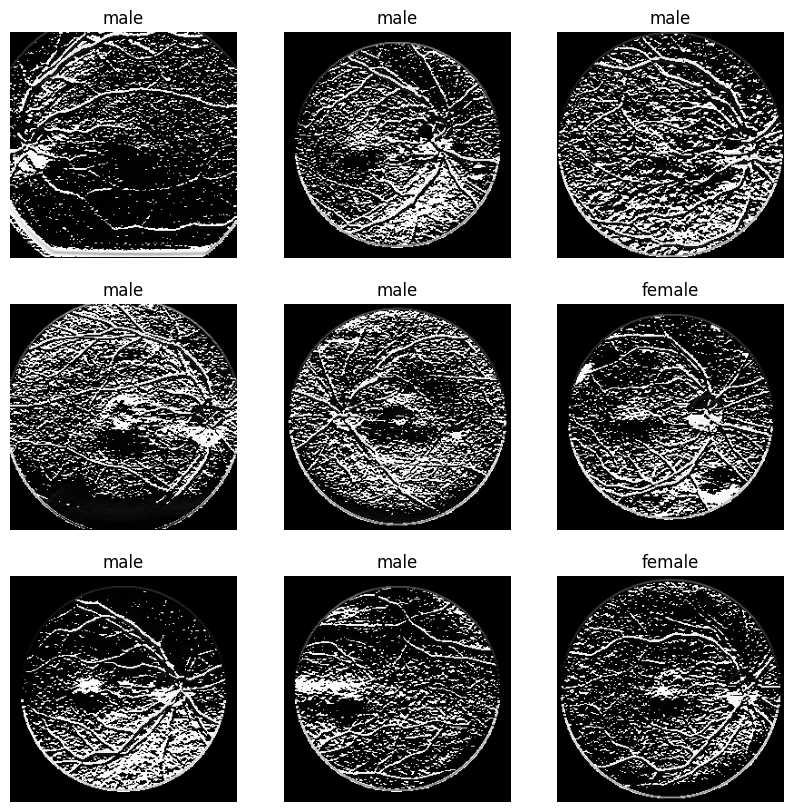

In [26]:
plt.figure(figsize=(10, 10))

for images, labels in gray_sobel_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)

        plt.imshow(images[i][:,:,0].numpy().astype("uint8"), cmap='gray')
        #plt.imshow(images[i][0, ..., 0].numpy().astype("uint8"), cmap='gray')
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [27]:
def augment_contrast(image, label):
    contrast = tf.image.random_contrast(image, 0.6, 0.9)
    return contrast, label
 
contrast_ds = gray_sobel_ds.map(augment_contrast)

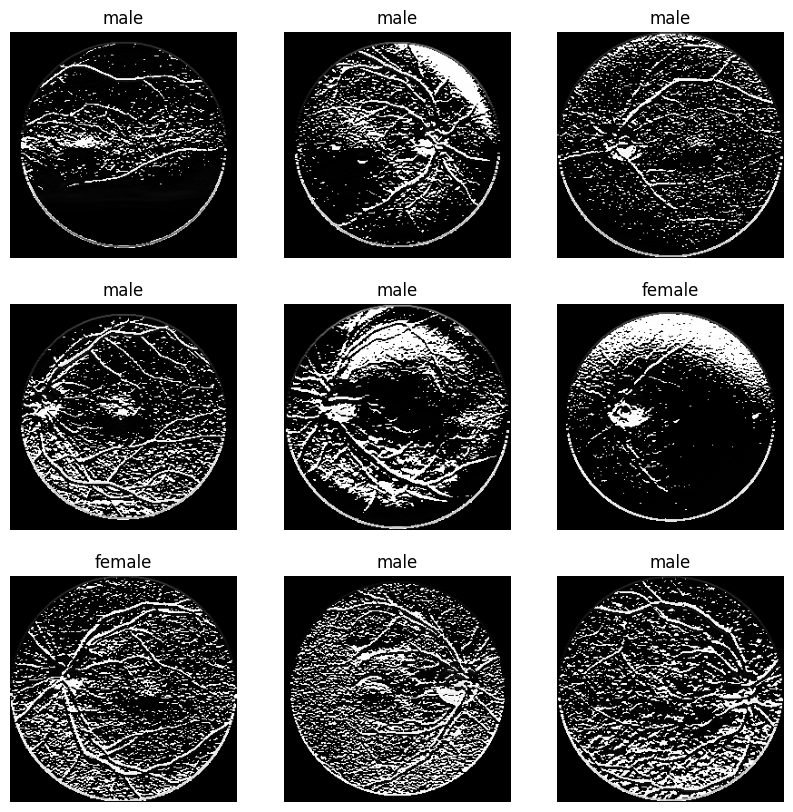

In [28]:
plt.figure(figsize=(10, 10))

for images, labels in contrast_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)

        plt.imshow(images[i][:,:,0].numpy().astype("uint8"), cmap='gray')
        #plt.imshow(images[i][0, ..., 0].numpy().astype("uint8"), cmap='gray')
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [29]:
def augment_bright(image, label):
    bright = tf.image.random_brightness(image, 0.2)
    return bright, label

bright_ds = gray_sobel_ds.map(augment_bright)

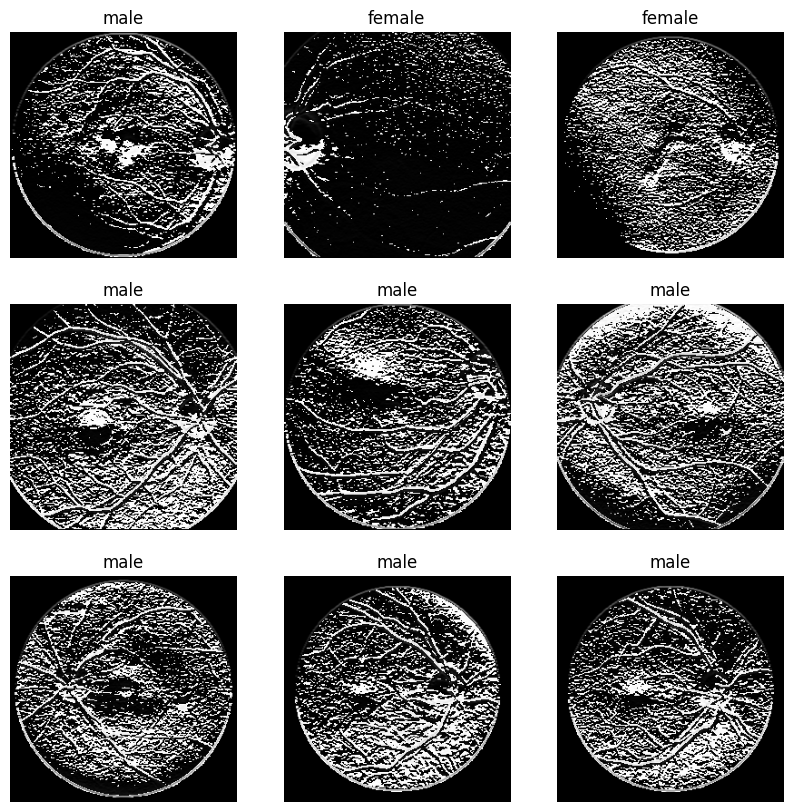

In [30]:
plt.figure(figsize=(10, 10))

for images, labels in bright_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)

        plt.imshow(images[i][:,:,0].numpy().astype("uint8"), cmap='gray')
        #plt.imshow(images[i][0, ..., 0].numpy().astype("uint8"), cmap='gray')
        plt.title(class_names[labels[i]])
        plt.axis("off")

--------------------------------